<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Catch'Up - News Recommender
_Authors: Li Jiansheng

---

## Overview
Everybody needs to know what is happening around us and many of us find that out through reading of articles online. We either read news for interest or for some, to make important decisions. Many of us spend alot of time searching for the news that are relevant or interesting to us. There are many recommender systems that try to solve this problem one way or the other. <br><br>
Catch'Up is one of such solutions. One main difference is that instead of going to a particular website before the user gets recommended, Catch'Up is a chrome extension that user can see the links he/she wants on the browser.<br>



## Project Methodology
To recommend relevant articles, we will make use of Machine Learning. There are many ways to achieve some form of recommendation but we will work from our problem. For Catchup, we will determine user's reading habits from his browser history. From his history we will determine his preferred topics via some form of classification. To classify his topics accurately, we will need a model trained with many articles. Each article should have a topic.

#### Import Libraries 

In [113]:

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import json

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

import spacy
import joblib

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords

import re
from bs4 import BeautifulSoup 
from nltk.corpus import stopwords
import scipy
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import roc_auc_score, make_scorer, recall_score, precision_score,accuracy_score

import numpy as np
import seaborn as sns

import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt

import warnings
from pprint import pprint


In [114]:
news_info={}

In [115]:
pd.set_option('display.max_columns',150)
pd.set_option('display.max_rows',1500)

## Articles Dataset
There are 2 sources of news articles. One of them is a csv file from Harvard University. The other from webhose with each article in a json file. We will make use of 2 of the datasets and merge them into a single dataframe.

https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/GMFCTR <br>
https://webhose.io/free-datasets/popular-news-articles/#


In [116]:
news_path = './news/NewsArticles.csv'

In [117]:
webhose1_path = './news/webhose1/'
webhose2_path = './news/webhose2/'

In [118]:
#Extracting JSON paths from data/articles source
fn=[]
#81224
for i in range(1,81224):
    if i>9999:
        fn.append('./news/webhose1/news_00'+str(i)+'.json')
    elif i>999:
        fn.append('./news/webhose1/news_000'+str(i)+'.json')
    elif i>99:
        fn.append('./news/webhose1/news_0000'+str(i)+'.json') 
    elif i>9:
        fn.append('./news/webhose1/news_00000'+str(i)+'.json')
    else:
        fn.append('./news/webhose1/news_000000'+str(i)+'.json')

fn

['./news/webhose1/news_0000001.json',
 './news/webhose1/news_0000002.json',
 './news/webhose1/news_0000003.json',
 './news/webhose1/news_0000004.json',
 './news/webhose1/news_0000005.json',
 './news/webhose1/news_0000006.json',
 './news/webhose1/news_0000007.json',
 './news/webhose1/news_0000008.json',
 './news/webhose1/news_0000009.json',
 './news/webhose1/news_0000010.json',
 './news/webhose1/news_0000011.json',
 './news/webhose1/news_0000012.json',
 './news/webhose1/news_0000013.json',
 './news/webhose1/news_0000014.json',
 './news/webhose1/news_0000015.json',
 './news/webhose1/news_0000016.json',
 './news/webhose1/news_0000017.json',
 './news/webhose1/news_0000018.json',
 './news/webhose1/news_0000019.json',
 './news/webhose1/news_0000020.json',
 './news/webhose1/news_0000021.json',
 './news/webhose1/news_0000022.json',
 './news/webhose1/news_0000023.json',
 './news/webhose1/news_0000024.json',
 './news/webhose1/news_0000025.json',
 './news/webhose1/news_0000026.json',
 './news/web

In [119]:
#the articles are stored in separate folders
fn2=[]
for i in range(1,89660):
    if i>9999:
        fn2.append('./news/webhose2/news_00'+str(i)+'.json')
    elif i>999:
        fn2.append('./news/webhose2/news_000'+str(i)+'.json')
    elif i>99:
        fn2.append('./news/webhose2/news_0000'+str(i)+'.json') 
    elif i>9:
        fn2.append('./news/webhose2/news_00000'+str(i)+'.json')
    else:
        fn2.append('./news/webhose2/news_000000'+str(i)+'.json')

fn2    

['./news/webhose2/news_0000001.json',
 './news/webhose2/news_0000002.json',
 './news/webhose2/news_0000003.json',
 './news/webhose2/news_0000004.json',
 './news/webhose2/news_0000005.json',
 './news/webhose2/news_0000006.json',
 './news/webhose2/news_0000007.json',
 './news/webhose2/news_0000008.json',
 './news/webhose2/news_0000009.json',
 './news/webhose2/news_0000010.json',
 './news/webhose2/news_0000011.json',
 './news/webhose2/news_0000012.json',
 './news/webhose2/news_0000013.json',
 './news/webhose2/news_0000014.json',
 './news/webhose2/news_0000015.json',
 './news/webhose2/news_0000016.json',
 './news/webhose2/news_0000017.json',
 './news/webhose2/news_0000018.json',
 './news/webhose2/news_0000019.json',
 './news/webhose2/news_0000020.json',
 './news/webhose2/news_0000021.json',
 './news/webhose2/news_0000022.json',
 './news/webhose2/news_0000023.json',
 './news/webhose2/news_0000024.json',
 './news/webhose2/news_0000025.json',
 './news/webhose2/news_0000026.json',
 './news/web

In [120]:
fd=[]
for f in fn:
    data = json.load(open(f))
    fd.append(data)
fd

[{'organizations': [],
  'uuid': 'b166f6b85b58506e290687e3b4e1273b57004816',
  'thread': {'social': {'gplus': {'shares': 0},
    'pinterest': {'shares': 0},
    'vk': {'shares': 0},
    'linkedin': {'shares': 0},
    'facebook': {'likes': 287, 'shares': 287, 'comments': 0},
    'stumbledupon': {'shares': 0}},
   'site_full': 'power1051.iheart.com',
   'main_image': 'http://i.iheart.com/v3/url/aHR0cHM6Ly9pLmloZWFydC5jb20vdjMvcmUvbmV3X2Fzc2V0cy81ODkyNWIyMzdiZmVhZTJjYWQ0ZDNlMGQ=?ops=',
   'site_section': '',
   'section_title': '',
   'url': 'http://power1051.iheart.com/onair/angie-martinez-54909/here-are-the-funniest-reaction-memes-15527130/',
   'country': 'US',
   'domain_rank': 1524,
   'title': "Here are The Funniest Reaction Memes To Beyonce's Pregnancy | Angie Martinez | Power 105.1 FM",
   'performance_score': 2,
   'site': 'iheart.com',
   'participants_count': 0,
   'title_full': "Here are The Funniest Reaction Memes To Beyonce's Pregnancy | Angie Martinez | Power 105.1 FM",
   

In [121]:

fd2=[]
for f in fn2:
    data = json.load(open(f))
    fd2.append(data)
fd2

[{'organizations': [],
  'uuid': 'c276d16aedb91cbad1306227ab8dcdd02d433a2a',
  'thread': {'social': {'gplus': {'shares': 0},
    'pinterest': {'shares': 1},
    'vk': {'shares': 0},
    'linkedin': {'shares': 0},
    'facebook': {'likes': 628, 'shares': 628, 'comments': 0},
    'stumbledupon': {'shares': 0}},
   'site_full': 'www.bollywoodlife.com',
   'main_image': 'http://www.bollywoodlife.com/wp-content/uploads/2017/03/vote-now.jpg',
   'site_section': 'http://www.bollywoodlife.com/feed/',
   'section_title': '',
   'url': 'http://www.bollywoodlife.com/news-gossip/allu-arjuns-duvvada-jagannadham-vs-pawan-kalyans-katamarayudu-whose-teaser-impressed-you/',
   'country': 'IN',
   'domain_rank': 4987,
   'title': 'Allu Arjun’s DJ vs Pawan Kalyan’s Katamarayudu: Which teaser impressed you?',
   'performance_score': 6,
   'site': 'bollywoodlife.com',
   'participants_count': 1,
   'title_full': 'Allu Arjun’s DJ vs Pawan Kalyan’s Katamarayudu: Which teaser impressed you?',
   'spam_score':

wh dictionary for containing all articles data. I merged the news articles from webhose folder 1 and folder 2 into wh dictionary

In [122]:
wh={}
wh1=[]
wh2=[]


From JSON, only url,title and text are extracted.

In [123]:
for d in fd:
    wh1.append(d['url']+' '+d['title']+' '+d['text'])


In [124]:
for d in fd2:
    wh2.append(d['url']+' '+d['title']+' '+d['text'])    

In [125]:
wh['content']=wh1+wh2
len(wh['content'])

170882

In [126]:

wh_df=pd.DataFrame(wh,index=range(len(wh['content'])))
wh_df

,content
0,http://power1051.iheart.com/onair/angie-martin...
1,https://www.ft.com/content/85e69f16-e6e6-11e6-...
2,http://www.channelnewsasia.com/news/asiapacifi...
3,https://mic.com/articles/167337/for-black-hist...
4,https://mic.com/articles/167051/dean-heller-ap...
...,...
170877,http://www.techradar.com/how-to/how-to-get-up-...
170878,http://www.washingtonexaminer.com/report-mike-...
170879,http://www.salon.com/2017/03/30/devin-nunes-bi...
170880,http://www.msn.com/en-us/news/crime/teacher-wh...


In [127]:
wh_df.shape

(170882, 1)

In [128]:
wh_df.isnull().sum()

content    0
dtype: int64

News source from Harvard university. We will do EDA on it.

In [129]:
news = pd.read_csv(news_path,engine='python')

In [130]:
news.head()

,article_id,publish_date,article_source_link,title,subtitle,text,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97,Unnamed: 98,Unnamed: 99,Unnamed: 100,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,Unnamed: 107,Unnamed: 108,Unnamed: 109,Unnamed: 110,Unnamed: 111,Unnamed: 112,Unnamed: 113,Unnamed: 114,Unnamed: 115,Unnamed: 116,Unnamed: 117,Unnamed: 118,Unnamed: 119,Unnamed: 120,Unnamed: 121,Unnamed: 122,Unnamed: 123,Unnamed: 124,Unnamed: 125,Unnamed: 126,Unnamed: 127,Unnamed: 128,Unnamed: 129,Unnamed: 130,Unnamed: 131,Unnamed: 132,Unnamed: 133,Unnamed: 134,Unnamed: 135,Unnamed: 136,Unnamed: 137,Unnamed: 138,Unnamed: 139,Unnamed: 140,Unnamed: 141,Unnamed: 142,Unnamed: 143
0,1,2017/2/7,http://abcnews.go.com/Politics/pence-break-tie...,"Betsy DeVos Confirmed as Education Secretary, ...",NaN,Michigan billionaire education activist Betsy ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2017/2/7,http://abcnews.go.com/Politics/wireStory/melan...,Melania Trump Says White House Could Mean Mill...,NaN,First lady Melania Trump has said little about...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2017/2/7,http://abcnews.go.com/Politics/wireStory/trump...,"As Trump Fears Fraud, GOP Eliminates Election ...",NaN,A House committee voted on Tuesday to eliminat...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2017/2/7,http://abcnews.go.com/Politics/appeals-court-d...,Appeals Court t

In [131]:
#Selecting columns of interest
news=news[['article_id','article_source_link','title','subtitle','text']]

In [132]:
news.isnull().sum()

article_id                0
article_source_link       0
title                    60
subtitle               1487
text                     33
dtype: int64

In [133]:
news.shape

(3824, 5)

Filled NA because other text column from the row is needed

In [134]:
news['subtitle'].fillna('', inplace=True)

In [135]:
news['title'].fillna('', inplace=True)

In [136]:
news['text'].fillna('', inplace=True)

In [137]:
news.isnull().sum()

article_id             0
article_source_link    0
title                  0
subtitle               0
text                   0
dtype: int64

In [138]:
news.head()

,article_id,article_source_link,title,subtitle,text
0,1,http://abcnews.go.com/Politics/pence-break-tie...,"Betsy DeVos Confirmed as Education Secretary, ...",,Michigan billionaire education activist Betsy ...
1,2,http://abcnews.go.com/Politics/wireStory/melan...,Melania Trump Says White House Could Mean Mill...,,First lady Melania Trump has said little about...
2,3,http://abcnews.go.com/Politics/wireStory/trump...,"As Trump Fears Fraud, GOP Eliminates Election ...",,A House committee voted on Tuesday to eliminat...
3,4,http://abcnews.go.com/Politics/appeals-court-d...,Appeals Court to Decide on Challenge to Trump'...,,"This afternoon, three federal judges from the ..."
4,5,http://abcnews.go.com/US/23-states-winter-weat...,At Least 4 Tornadoes Reported in Southeast Lou...,,At least four tornadoes touched down in Louisi...


In [139]:
 news['content']=news['article_source_link']+' '+news['title']+' '+news['subtitle']+' '+news['text']

In [140]:
news.shape

(3824, 6)

In [141]:
news=news[['content']]

In [142]:
news

,content
0,http://abcnews.go.com/Politics/pence-break-tie...
1,http://abcnews.go.com/Politics/wireStory/melan...
2,http://abcnews.go.com/Politics/wireStory/trump...
3,http://abcnews.go.com/Politics/appeals-court-d...
4,http://abcnews.go.com/US/23-states-winter-weat...
...,...
3819,http://www.rte.ie/news/ireland/2017/0330/86367...
3820,http://www.rte.ie/news/connacht/2017/0330/8638...
3821,http://www.rte.ie/news/ulster/2017/0330/863787...
3822,http://www.rte.ie/news/ireland/2017/0330/86391...


### Merge All Datasets

In [143]:
news_df = pd.concat([wh_df, news], ignore_index=True)
news_df


,content
0,http://power1051.iheart.com/onair/angie-martin...
1,https://www.ft.com/content/85e69f16-e6e6-11e6-...
2,http://www.channelnewsasia.com/news/asiapacifi...
3,https://mic.com/articles/167337/for-black-hist...
4,https://mic.com/articles/167051/dean-heller-ap...
...,...
174701,http://www.rte.ie/news/ireland/2017/0330/86367...
174702,http://www.rte.ie/news/connacht/2017/0330/8638...
174703,http://www.rte.ie/news/ulster/2017/0330/863787...
174704,http://www.rte.ie/news/ireland/2017/0330/86391...


In [144]:
news_df.shape

(174706, 1)

In [145]:
news_df=news_df[['content']]

In [146]:
news_df

,content
0,http://power1051.iheart.com/onair/angie-martin...
1,https://www.ft.com/content/85e69f16-e6e6-11e6-...
2,http://www.channelnewsasia.com/news/asiapacifi...
3,https://mic.com/articles/167337/for-black-hist...
4,https://mic.com/articles/167051/dean-heller-ap...
...,...
174701,http://www.rte.ie/news/ireland/2017/0330/86367...
174702,http://www.rte.ie/news/connacht/2017/0330/8638...
174703,http://www.rte.ie/news/ulster/2017/0330/863787...
174704,http://www.rte.ie/news/ireland/2017/0330/86391...


Saving news article dataframe into a csv.

In [147]:
news_csv=pd.DataFrame(news_df).to_csv('./datasets/news.csv', index = True)


In [3]:
news_df=pd.read_csv('./datasets/news.csv')

As we have too many articles to model. I break them apart to find the best number for modelling. 

In [148]:
news6k=news_df.sample(n=6000,random_state=42)
news8k=news_df.sample(n=8000,random_state=42)
news10k=news_df.sample(n=10000,random_state=42)

In [6]:
news20k=news_df.sample(n=20000,random_state=42)
news30k=news_df.sample(n=30000,random_state=42)
news50k=news_df.sample(n=50000,random_state=42)

### 10k is chosen
I tried a few of them and the optimum number is 10k. We will clean these articles for topic modelling.

In [7]:
# Convert to list
data = news10k.content.values.tolist()

# Remove Emails
data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]

# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]

pprint(data[:1])

<>:5: DeprecationWarning: invalid escape sequence \S
<>:8: DeprecationWarning: invalid escape sequence \s
<>:5: DeprecationWarning: invalid escape sequence \S
<>:8: DeprecationWarning: invalid escape sequence \s
<>:5: DeprecationWarning: invalid escape sequence \S
<>:8: DeprecationWarning: invalid escape sequence \s
<ipython-input-7-0c1d8adde1d6>:5: DeprecationWarning: invalid escape sequence \S
  data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]
<ipython-input-7-0c1d8adde1d6>:8: DeprecationWarning: invalid escape sequence \s
  data = [re.sub('\s+', ' ', sent) for sent in data]


['http://www.phonearena.com/news/LG-V30-rumored-to-sport-Snapdragon-835-6-GB-RAM-and-dual-front-and-back-cameras_id91119 '
 'LG V30 rumored to sport Snapdragon 835, 6 GB RAM and dual front and back '
 'cameras › LG V30 rumored to sport Snapdragon 835, 6 GB RAM and dual front '
 'and back cameras LG V30 rumored to sport Snapdragon 835, 6 GB RAM and dual '
 'front and back cameras Posted: Tags : LG - LG + The LG V20 LG went through a '
 'rather difficult 2016. The company attempted to shake things up with the '
 'bold designs of its G5 and V20 handsets, but its gamble didnt pay off as '
 'both models failed to entice the mass consumer and sold poorly. As a result, '
 'the South Korean firm has reportedly changed tactics and is likely to adopt '
 'a more traditional approach in 2017. The LG G6 will have its premiere at MWC '
 'which is just around the corner, so we do have a considerable amount of '
 'information about the device. One of the biggest let downs of the upcoming '
 'flagship 

In [8]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['http', 'www', 'phonearena', 'com', 'news', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb', 'ram', 'and', 'dual', 'front', 'and', 'back', 'cameras_id', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb', 'ram', 'and', 'dual', 'front', 'and', 'back', 'cameras', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb', 'ram', 'and', 'dual', 'front', 'and', 'back', 'cameras', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb', 'ram', 'and', 'dual', 'front', 'and', 'back', 'cameras', 'posted', 'tags', 'lg', 'lg', 'the', 'lg', 'lg', 'went', 'through', 'rather', 'difficult', 'the', 'company', 'attempted', 'to', 'shake', 'things', 'up', 'with', 'the', 'bold', 'designs', 'of', 'its', 'and', 'handsets', 'but', 'its', 'gamble', 'didnt', 'pay', 'off', 'as', 'both', 'models', 'failed', 'to', 'entice', 'the', 'mass', 'consumer', 'and', 'sold', 'poorly', 'as', 'result', 'the', 'south', 'korean', 'firm', 'has', 'reportedly', 'changed', 'tactics', 'and', 'is', 'likely', 'to', 'adopt', 'more', 'traditi

In [9]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['http_www_phonearena_com', 'news', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb_ram', 'and', 'dual', 'front', 'and', 'back', 'cameras_id', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb_ram', 'and', 'dual', 'front', 'and', 'back', 'cameras', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb_ram', 'and', 'dual', 'front', 'and', 'back', 'cameras', 'lg', 'rumored', 'to', 'sport', 'snapdragon', 'gb_ram', 'and', 'dual', 'front', 'and', 'back', 'cameras', 'posted', 'tags', 'lg', 'lg', 'the', 'lg', 'lg', 'went', 'through', 'rather', 'difficult', 'the', 'company', 'attempted', 'to', 'shake', 'things', 'up', 'with', 'the', 'bold', 'designs', 'of', 'its', 'and', 'handsets', 'but', 'its', 'gamble', 'didnt', 'pay', 'off', 'as', 'both', 'models', 'failed', 'to', 'entice', 'the', 'mass', 'consumer', 'and', 'sold', 'poorly', 'as', 'result', 'the', 'south_korean', 'firm', 'has', 'reportedly', 'changed', 'tactics', 'and', 'is', 'likely', 'to', 'adopt', 'more', 'traditional', 'approach', 'in', 

In [10]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
stop_words = stopwords.words('english')
stop_words.extend(['http','https','www','com','abcnews','rte','cnn','huffingtonpost','news','bbc','tass','dw','aljeezra','chinadaily','ie','go','politics','said','say','one','would','year','pm', 'nbcsn', 'csn', 'et', 'pt', 'ct', 'ht', 'mt'])
more_stop=['like','first','two','get']
def remove_stopwords(texts):
    return [[word for word in gensim.utils.simple_preprocess(str(doc)) if word not in (stop_words+more_stop)] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [11]:
import en_core_web_sm
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = en_core_web_sm.load()

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])


[['dual', 'front', 'back', 'rumor', 'dual', 'front', 'back', 'camera', 'dual', 'front', 'back', 'camera', 'dual', 'front', 'back', 'camera', 'post', 'go', 'rather', 'difficult', 'company', 'attempt', 'shake', 'thing', 'bold', 'design', 'handset', 'gamble', 'pay', 'model', 'fail', 'consumer', 'sell', 'poorly', 'result', 'firm', 'reportedly', 'change', 'tactic', 'likely', 'adopt', 'traditional', 'approach', 'corner', 'considerable', 'amount', 'information', 'device', 'big', 'let', 'down', 'upcome', 'flagship', 'probably', 'will', 'sport', 'late', 'high', 'end', 'effectively', 'hoard', 'batch', 'make', 'may', 'big', 'disappointment', 'fan', 'brand', 'however', 'may', 'actually', 'redeem', 'release', 'late', 'speculation', 'suggest', 'indeed', 'host', 'also', 'boast', 'truly', 'unique', 'camera_setup', 'set', 'dual', 'camera', 'front', 'back', 'bunch', 'mysterious', 'feature', 'also', 'mention', 'specify', 'rumor', 'suggest', 'take', 'information', 'pinch', 'salt', 'detail', 'bind', 'come'

In [13]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 2), (3, 1), (4, 1), (5, 1), (6, 5), (7, 1), (8, 1), (9, 2), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 4), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 5), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 5), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 2), (47, 1), (48, 2), (49, 1), (50, 1), (51, 1), (52, 2), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 2), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 2), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (87, 1)]]


## LDA for Topic Modelling
We use LDA for topic modelling. LDA tries to cluster different words to form topics based on the number of topics required. To determine what is the best number of topics, LDA gives a coherence score that informs you how different the topics are. The higher the score, the more separated the topics are. This would be better. As our final goal is a news recommender, we cannot have too few topics. I have decided to pick 10,15 and 20 topics to see which gives the best coherence score.



In [14]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [15]:
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.094*"child" + 0.057*"family" + 0.030*"mother" + 0.030*"death" + '
  '0.029*"parent" + 0.028*"baby" + 0.024*"doctor" + 0.024*"die" + 0.022*"age" '
  '+ 0.020*"life"'),
 (1,
  '0.030*"black" + 0.023*"look" + 0.021*"wear" + 0.020*"girl" + 0.015*"white" '
  '+ 0.012*"photo" + 0.011*"beauty" + 0.011*"top" + 0.010*"leave" + '
  '0.010*"style"'),
 (2,
  '0.076*"flight" + 0.071*"animal" + 0.061*"passenger" + 0.058*"bus" + '
  '0.057*"airport" + 0.052*"travel" + 0.043*"trip" + 0.042*"train" + '
  '0.032*"fly" + 0.025*"rocket"'),
 (3,
  '0.038*"team" + 0.033*"game" + 0.028*"season" + 0.027*"play" + '
  '0.026*"player" + 0.018*"win" + 0.017*"sport" + 0.017*"second" + 0.015*"run" '
  '+ 0.013*"last"'),
 (4,
  '0.026*"photo" + 0.025*"video" + 0.025*"share" + 0.018*"show" + 0.017*"new" '
  '+ 0.015*"post" + 0.012*"reveal" + 0.012*"read" + 0.011*"story" + '
  '0.010*"take"'),
 (5,
  '0.011*"also" + 0.011*"company" + 0.010*"new" + 0.009*"business" + '
  '0.009*"work" + 0.008*"use" + 0.008*"h

In [111]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.47698430550248616


In [149]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9     -0.270757 -0.021227       1        1  28.191248
5     -0.237302  0.021393       2        1  17.489065
8     -0.214917  0.090802       3        1   8.753895
4     -0.186775 -0.094550       4        1   8.392352
12    -0.184329  0.146137       5        1   6.210386
19    -0.155572  0.174027       6        1   5.137004
3     -0.187218 -0.156268       7        1   5.072000
11    -0.099829 -0.223700       8        1   4.286754
1     -0.036126 -0.187195       9        1   3.547125
16    -0.066367 -0.056800      10        1   3.295286
0      0.059663  0.134980      11        1   1.834915
18     0.044891  0.022059      12        1   1.780994
15     0.046915  0.220158      13        1   1.577358
13     0.112393  0.071852      14        1   1.442708
10     0.188521  0.079155      15        1   0.772502
17     0.226004 -0.030190      16        1   0.668295
6      0.203055 -0.110176      17        1   0.563257
7      0.246514 -0.047176      18        1   0.353977
2      0.250778 -0.020544      19        1   0.331334
14     0.260459 -0.012740      20        1   0.299540, topic_info=                      Term          Freq         Total Category  logprob  \
479                   show   8055.000000   8055.000000  Default  30.0000   
503                  trump   7701.000000   7701.000000  Default  29.0000   
985                  world   4486.000000   4486.000000  Default  28.0000   
429                    new   8691.000000   8691.000000  Default  27.0000   
535                    day   7336.000000   7336.000000  Default  26.0000   
527                  child   3768.000000   3768.000000  Default  25.0000   
507                    use   6914.000000   6914.000000  Default  24.0000   
540                 family   4382.000000   4382.000000  Default  23.0000   
358                country   4214.000000   4214.000000  Default  22.0000   
681             government   5314.000000   5314.000000  Default  21.0000   
1166                police   4285.000000   4285.000000  Default  20.0000   
541                   find   6340.000000   6340.000000  Default  19.0000   
1818                   sit   2494.000000   2494.000000  Default  18.0000   
1030                 state   5196.000000   5196.000000  Default  17.0000   
935                   look   6317.000000   6317.000000  Default  16.0000   
638                   team   4449.000000   4449.000000  Default  15.0000   
573                  photo   5363.000000   5363.000000  Default  14.0000   
180                   good   7440.000000   7440.000000  Default  13.0000   
862                   play   4834.000000   4834.000000  Default  12.0000   
597                  woman   6157.000000   6157.000000  Default  11.0000   
586                student   2525.000000   2525.000000  Default  10.0000   
571                 people  11451.000000  11451.000000  Default   9.0000   
478                  share   4889.000000   4889.000000  Default   8.0000   
509                  video   4215.000000   4215.000000  Default   7.0000   
205                   life   3860.000000   3860.000000  Default   6.0000   
2065                school   2632.000000   2632.000000  Default   5.0000   
175                   game   3354.000000   3354.000000  Default   4.0000   
441                percent   1876.000000   1876.000000  Default   3.0000   
1839                  city   2943.000000   2943.000000  Default   2.0000   
688                    man   4595.000000   4595.000000  Default   1.0000   
80                   thing   4646.350586   4647.472168   Topic1  -4.8121   
521                     be   3767.021240   3768.142578   Topic1  -5.0219   
163                   feel   3715.158936   3716.280273   Topic1  -5.0357   
462                 really   3507.010010   3508.131348   Topic1  -5.0934   
409                    lot   2709.592773   2710.714111   Topic1  -5.3513   
95                  always   2138

In [84]:
lda_model10 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [150]:
# Compute Coherence Score
coherence_model_lda10 = CoherenceModel(model=lda_model10, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda10 = coherence_model_lda10.get_coherence()
print('\nCoherence Score: ', coherence_lda10)


Coherence Score:  0.4575513884974118


In [86]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model10, corpus, dictionary=lda_model10.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9      0.189698 -0.021987       1        1  28.378162
8      0.206201  0.022974       2        1  18.733435
5      0.163387 -0.071561       3        1  16.660124
4      0.076147 -0.013745       4        1  11.273552
0      0.120388  0.016981       5        1   8.818954
3      0.047462  0.136808       6        1   5.104523
2     -0.091114  0.141802       7        1   4.261575
1     -0.160486 -0.360083       8        1   4.009336
7     -0.263152  0.067101       9        1   1.996718
6     -0.288532  0.081709      10        1   0.763622, topic_info=       Term         Freq        Total Category  logprob  loglift
479    show  6915.000000  6915.000000  Default  30.0000  30.0000
985   world  3785.000000  3785.000000  Default  29.0000  29.0000
503   trump  6611.000000  6611.000000  Default  28.0000  28.0000
597   woman  5338.000000  5338.000000  Default  27.0000  27.0000
429     new  7400.000000  7400.000000  Default  26.0000  26.0000
...     ...          ...          ...      ...      ...      ...
862    play   186.308060  4161.942871  Topic10  -4.4198   1.7685
535     day   174.714035  6242.883301  Topic10  -4.4840   1.2988
1839   city   119.387726  2407.131348  Topic10  -4.8648   1.8710
429     new   126.632507  7400.791504  Topic10  -4.8059   0.8068
921   final    94.686516  1246.781494  Topic10  -5.0966   2.2971

[581 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
319       2  0.195126  accord
319       3  0.474057  accord
319       4  0.037524  accord
319       5  0.269237  accord
319       6  0.010632  accord
...     ...       ...     ...
514       2  0.026128    year
514       3  0.312473    year
514       4  0.061855    year
514       5  0.140595    year
514       6  0.014930    year

[1127 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[10, 9, 6, 5, 1, 4, 3, 2, 8, 7])

In [87]:
lda_model15 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=15, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [88]:
# Compute Coherence Score
coherence_model_lda15 = CoherenceModel(model=lda_model15, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda15 = coherence_model_lda15.get_coherence()
print('\nCoherence Score: ', coherence_lda15)


Coherence Score:  0.48337242448577994


In [151]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model15, corpus, dictionary=lda_model15.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.235271  0.090401       1        1  20.706553
9      0.212837 -0.012074       2        1  16.063028
8      0.227678 -0.081112       3        1  16.010910
4      0.176325 -0.009176       4        1  11.091578
5      0.193250  0.102770       5        1  10.784781
11     0.179408  0.112844       6        1   8.592860
10     0.003430 -0.194248       7        1   3.531538
13     0.007771 -0.282521       8        1   3.413775
14    -0.020865  0.224172       9        1   2.702631
0     -0.045661 -0.116298      10        1   2.521246
1     -0.158402  0.120230      11        1   1.763554
2     -0.150377 -0.032064      12        1   1.698758
7     -0.264633  0.020762      13        1   0.649281
6     -0.296300  0.030975      14        1   0.275465
3     -0.299733  0.025339      15        1   0.194041, topic_info=                      Term          Freq         Total Category  logprob  \
503                  trump   7374.000000   7374.000000  Default  30.0000   
479                   show   8085.000000   8085.000000  Default  29.0000   
1166                police   4275.000000   4275.000000  Default  28.0000   
429                    new   8680.000000   8680.000000  Default  27.0000   
527                  child   3743.000000   3743.000000  Default  26.0000   
985                  world   4514.000000   4514.000000  Default  25.0000   
2065                school   2926.000000   2926.000000  Default  24.0000   
19                 company   3954.000000   3954.000000  Default  23.0000   
507                    use   7026.000000   7026.000000  Default  22.0000   
597                  woman   6140.000000   6140.000000  Default  21.0000   
586                student   2844.000000   2844.000000  Default  20.0000   
535                    day   7149.000000   7149.000000  Default  19.0000   
862                   play   4740.000000   4740.000000  Default  18.0000   
1839                  city   2824.000000   2824.000000  Default  17.0000   
1818                   sit   2416.000000   2416.000000  Default  16.0000   
541                   find   6398.000000   6398.000000  Default  15.0000   
1726                  vote   2638.000000   2638.000000  Default  14.0000   
1030                 state   5210.000000   5210.000000  Default  13.0000   
688                    man   4547.000000   4547.000000  Default  12.0000   
571                 people  11510.000000  11510.000000  Default  11.0000   
573                  photo   5238.000000   5238.000000  Default  10.0000   
638                   team   4233.000000   4233.000000  Default   9.0000   
1174                report   5548.000000   5548.000000  Default   8.0000   
509                  video   4143.000000   4143.000000  Default   7.0000   
175                   game   3179.000000   3179.000000  Default   6.0000   
370               election   2323.000000   2323.000000  Default   5.0000   
2603                   car   2010.000000   2010.000000  Default   4.0000   
681             government   5198.000000   5198.000000  Default   3.0000   
180                   good   7532.000000   7532.000000  Default   2.0000   
2319                  film   3125.000000   3125.000000  Default   1.0000   
755              different   2279.697998   2280.762207   Topic1  -5.2155   
394                   idea   1456.409302   1457.473389   Topic1  -5.6636   
725                   true    985.724609    986.788452   Topic1  -6.0540   
1814                  self    772.942322    774.006165   Topic1  -6.2971   
2878                 sense    772.627136    773.690979   Topic1  -6.2975   
232                  piece    747.208130    748.271973   Topic1  -6.3310   
98                     art    730.193787    731.257629   Topic1  -6.3540   
442                perhaps    642.786926    643.850769   Topic1  -6.4815   
1695                simple    626.173828    627.237671   Topic1  -6.5077   

## Conclusion
I have decided to use 20 topics though the score is slightly lesser than 15 topics. One of the reasons is even though the first few topics are closely related, 20 topics give a better separation. Also the articles could be slightly unbalanced to the first few topics.

### Further Improvements using Mallet LDA
Mallet LDA is also used for topic modelling. However it is known to be better than GenSim's LDA method though it is slower.

In [24]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = './mallet-2.0.8/bin/mallet' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

In [25]:
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(13,
  [('win', 0.020791807407230585),
   ('time', 0.01577885728608429),
   ('run', 0.015361111442655432),
   ('title', 0.013069477101559982),
   ('lead', 0.012866571977608822),
   ('fight', 0.012174307437069572),
   ('match', 0.011649141233901865),
   ('lose', 0.01130300896363224),
   ('make', 0.011279137772579164),
   ('point', 0.010252676557296826)]),
 (2,
  [('food', 0.014306003873466753),
   ('make', 0.009799870884441576),
   ('dog', 0.00870238863783086),
   ('include', 0.008366688185926403),
   ('eat', 0.007682375726275016),
   ('open', 0.0076307295029051),
   ('find', 0.007346675274370561),
   ('restaurant', 0.007269205939315688),
   ('good', 0.006920593931568754),
   ('store', 0.006675274370561653)]),
 (18,
  [('phone', 0.010354665748438192),
   ('feature', 0.010231688720547001),
   ('user', 0.01013330709823405),
   ('online', 0.009813566825716956),
   ('launch', 0.008473117221702986),
   ('device', 0.007956613704559988),
   ('content', 0.007956613704559988),
   ('update', 0.0

Using 20 topics for Mallet improves the score to 0.5.

In [90]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=ldamallet, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,18.0,0.2733,"phone, feature, user, online, launch, device, ...",http://www.phonearena.com/news/LG-V30-rumored-...
1,1,0.0,0.3309,"image, music, year, world, art, space, perform...",http://pitchfork.com/reviews/albums/22948-the-...
2,2,8.0,0.2916,"country, government, force, military, official...",https://www.rt.com/news/381216-trump-merkel-na...
3,3,17.0,0.2444,"family, child, life, home, live, friend, die, ...",http://www.self.com/story/mark-zuckerberg-pris...
4,4,4.0,0.1371,"company, work, business, job, project, plan, g...",http://www.news.com.au/finance/business/retail...
5,5,10.0,0.1217,"trump, vote, election, president, campaign, st...",http://www.smh.com.au/federal-politics/politic...
6,6,7.0,0.4666,"pay, money, government, cost, percent, plan, c...",http://www.cbc.ca/news/canada/saskatchewan/sas...
7,7,1.0,0.4077,"photo, show, share, wear, reveal, picture, lov...",http://www.mirror.co.uk/3am/celebrity-news/jer...
8,8,12.0,0.2902,"people, school, student, country, group, commu...",http://www.nbcnews.com/news/latino/opinion-ice...
9,9,3.0,0.2257,"film, show, good, story, movie, award, watch, ...",http://www.hellomagazine.com/celebrities/20170...


We assigned dominant topics to the documents so that we can do classification later.

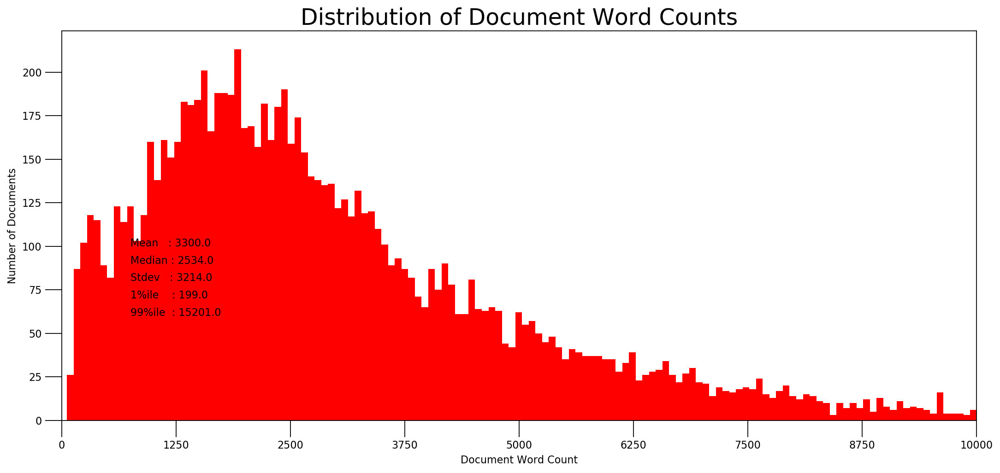

In [63]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='red')
plt.text(750, 100, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(750,  90, "Median : " + str(round(np.median(doc_lens))))
plt.text(750,  80, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(750,  70, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(750,  60, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 10000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,10000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

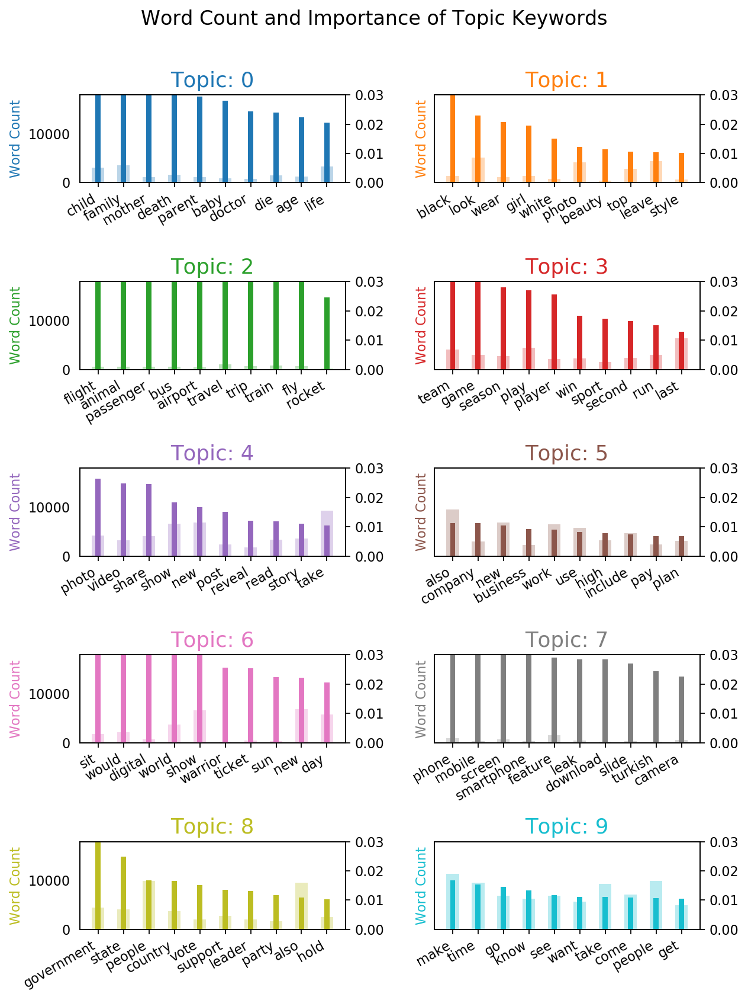

In [181]:
from collections import Counter
topics = lda_model.show_topics(num_topics=20, formatted=False)
data_flat = [w for w_list in data_lemmatized for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(5, 2, figsize=(8,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 18000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    #ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=15, y=1.05)    
plt.show()

## Create a Dataframe for Multclass Classification

In [27]:
news_w_topic=df_dominant_topic[['Dominant_Topic','Text']]

In [28]:
news_w_topic=news_w_topic.rename(columns={"Dominant_Topic": "topic", "Text": "content"})
news_w_topic


,topic,content
0,18.0,http://www.phonearena.com/news/LG-V30-rumored-...
1,0.0,http://pitchfork.com/reviews/albums/22948-the-...
2,8.0,https://www.rt.com/news/381216-trump-merkel-na...
3,17.0,http://www.self.com/story/mark-zuckerberg-pris...
4,4.0,http://www.news.com.au/finance/business/retail...
...,...,...
9995,15.0,http://www.manchestereveningnews.co.uk/news/gr...
9996,8.0,https://www.nytimes.com/2017/03/13/world/europ...
9997,1.0,http://www.mensxp.com/entertainment/gossip/348...
9998,12.0,http://reason.com/archives/2016/10/24/anti-imm...


In [29]:
news_w_topic

,topic,content
0,18.0,http://www.phonearena.com/news/LG-V30-rumored-...
1,0.0,http://pitchfork.com/reviews/albums/22948-the-...
2,8.0,https://www.rt.com/news/381216-trump-merkel-na...
3,17.0,http://www.self.com/story/mark-zuckerberg-pris...
4,4.0,http://www.news.com.au/finance/business/retail...
...,...,...
9995,15.0,http://www.manchestereveningnews.co.uk/news/gr...
9996,8.0,https://www.nytimes.com/2017/03/13/world/europ...
9997,1.0,http://www.mensxp.com/entertainment/gossip/348...
9998,12.0,http://reason.com/archives/2016/10/24/anti-imm...


Create dataframes with different number of samples to determine which is the most efficient.

In [30]:
news_w_topic2k=news_w_topic.sample(n=2000,random_state=42)
news_w_topic4k=news_w_topic.sample(n=4000,random_state=42)
news_w_topic6k=news_w_topic.sample(n=6000,random_state=42)

In [31]:
news_w_topic6k.shape

(6000, 2)

In [32]:
news_topic2k=pd.DataFrame(news_w_topic2k).to_json('./datasets/news_w_topic2k.json', index = True)

In [33]:
news_w_topic2k['content']=[c.lower() for c in news_w_topic2k['content']]
news_w_topic4k['content']=[c.lower() for c in news_w_topic4k['content']]
news_w_topic6k['content']=[c.lower() for c in news_w_topic6k['content']]

In [34]:
X_train, X_test, y_train, y_test = train_test_split(news_w_topic6k[['content']],
                                                    news_w_topic6k['topic'],
                                                    test_size = 0.25,
                                                    stratify=news_w_topic6k['topic'],
                                                    random_state = 42)

In [35]:
def review_to_words(raw_content):
    # Function to convert a raw review to a string of words
    # The input is a single string (a raw movie review), and 
    # the output is a single string (a preprocessed movie review)
    
    # 1. Remove HTML.
    content_text = BeautifulSoup(raw_content).get_text()
    
    # 2. Remove non-letters.
    letters_only = re.sub("[^a-zA-Z]", " ", content_text)
    
    # 3. Convert to lower case, split into individual words.
    words = letters_only.lower().split()
    
    # 4. In Python, searching a set is much faster than searching
    # a list, so convert the stop words to a set.
    stops = stopwords.words('english')
    stop_words.extend(['http','https','www','com','abcnews','rte','cnn','huffingtonpost','news','bbc','tass','dw','aljeezra','chinadaily','ie','go','politics','said','say','one','would','year','pm', 'nbcsn', 'csn', 'et', 'pt', 'ct', 'ht', 'mt','like','first','two','get'])
    
    stops = stop_words
  
    # 5. Remove stop words.
    meaningful_words = [w for w in words if not w in stops]
    # 6. Lemmatize our words
    lemmatizer = WordNetLemmatizer()
    tokens_lem = [lemmatizer.lemmatize(i) for i in meaningful_words]
    
    # 7. Join the words back into one string separated by space, 
    # and return the result.
    return(" ".join(tokens_lem))

In [36]:

# Initialize an empty list to hold the clean posts.
clean_train_content = []
clean_test_content = []

In [37]:
clean_user_content=[]

In [38]:
print("Cleaning and parsing the training set content...")
c=0
j = 0
for train_content in X_train['content']:
    # Convert posts to words, then append to clean_train_content.
    clean_train_content.append(review_to_words(train_content))
    c=c+1
    

print(c)    

Cleaning and parsing the training set content...
4500


In [39]:
len(clean_train_content)

4500

In [40]:
print("Cleaning and parsing the testing set content...")

for test_content in X_test['content']:
    # Convert posts to words, then append to clean_train_content.
    clean_test_content.append(review_to_words(test_content))

Cleaning and parsing the testing set content...


In [42]:
len(clean_train_content)

4500

In [43]:
ct_df=pd.DataFrame(clean_test_content)

In [44]:
ctc=ct_df.sample(n=20,random_state=42)

In [45]:
ctc.shape

(20, 1)

In [46]:
clean_train=pd.DataFrame(clean_train_content).to_json('./datasets/clean_train_6k.json', index = True)
clean_test=pd.DataFrame(clean_test_content).to_json('./datasets/clean_test_6k.json', index = True)

In [47]:
ctc_file=pd.DataFrame(ctc).to_json('./datasets/ctc20.json', index = True)


In [48]:
user_df=pd.DataFrame(clean_user_content)
user_json=user_df.to_json('./datasets/user5k.json', index = True)

## Linear Regression Model

In [49]:
pipe = Pipeline([('tfid', TfidfVectorizer()),
                 ('lr', LogisticRegression(solver='lbfgs'))
                ])

In [50]:
cross_val_score(pipe, clean_train_content, y_train, cv=5)

array([0.71333333, 0.70444444, 0.73111111, 0.73222222, 0.71222222])

In [51]:
# ii. Fit into model
pipe.fit(clean_train_content, y_train)

# Training score
print(pipe.score(clean_train_content, y_train))

# Test score
print(pipe.score(clean_test_content, y_test))

0.9406666666666667
0.734


In [52]:
pipe_params = {
    'tfid__max_features': [2500, 3000, 3500],
    'tfid__min_df': [1, 2],
    'tfid__max_df': [.8,.9, .95],
    'tfid__ngram_range': [(1,1), (1,2)]
}
scorers = {
    'precision_score': make_scorer(precision_score),
    'recall_score': make_scorer(recall_score),
    'accuracy_score': make_scorer(accuracy_score)
}
#scorers dictionary allows us to prioritize which score we want for the model. Then we refit back the parameters to our model
gs = GridSearchCV(pipe,param_grid=pipe_params,scoring=make_scorer(accuracy_score),refit='accuracy_score', cv=5)

In [53]:
%time 
gs.fit(clean_train_content, y_train)
print(gs.best_score_)
gs.best_params_

CPU times: user 9 µs, sys: 3 µs, total: 12 µs
Wall time: 1.09 ms
0.7293333333333333


{'tfid__max_df': 0.8,
 'tfid__max_features': 3500,
 'tfid__min_df': 1,
 'tfid__ngram_range': (1, 1)}

In [54]:
gs.score(clean_train_content, y_train)

0.904

In [55]:
gs.score(clean_test_content, y_test)

0.7453333333333333

In [56]:
lr_predictions=gs.predict(clean_test_content)

In [57]:
lr_predictions

array([ 7., 10.,  5., ...,  5., 14.,  1.])

In [58]:
lr_cm=confusion_matrix(y_test, lr_predictions)

In [59]:
lr_cm_df = pd.DataFrame(lr_cm, columns=['pred topic 1', 'pred topic 2', 'pred topic 3', 'pred topic 4', 'pred topic 5', 'pred topic 6', 'pred topic 7', 'pred topic 8', 'pred topic 9', 'pred topic 10', 'pred topic 11', 'pred topic 12', 'pred topic 13', 'pred topic 14', 'pred topic 15', 'pred topic 16', 'pred topic 17', 'pred topic 18', 'pred topic 19', 'pred topic 20'], index=['actual topic 1','actual topic 2','actual topic 3','actual topic 4','actual topic 5','actual topic 6','actual topic 7','actual topic 8','actual topic 9','actual topic 10','actual topic 11','actual topic 12','actual topic 13','actual topic 14','actual topic 15','actual topic 16','actual topic 17','actual topic 18','actual topic 19','actual topic 20'])
lr_cm_df

,pred topic 1,pred topic 2,pred topic 3,pred topic 4,pred topic 5,pred topic 6,pred topic 7,pred topic 8,pred topic 9,pred topic 10,pred topic 11,pred topic 12,pred topic 13,pred topic 14,pred topic 15,pred topic 16,pred topic 17,pred topic 18,pred topic 19,pred topic 20
actual topic 1,51,3,0,2,0,0,0,1,0,0,0,0,1,0,1,1,2,1,4,2
actual topic 2,1,56,2,5,1,0,0,0,0,3,2,1,0,0,0,1,1,2,0,0
actual topic 3,1,1,44,3,1,0,1,1,1,1,0,0,0,1,0,1,3,1,4,0
actual topic 4,4,2,0,88,0,1,0,0,0,0,2,0,1,1,0,0,0,0,1,0
actual topic 5,0,1,2,1,35,1,0,5,1,0,5,0,3,0,0,0,4,0,0,0
actual topic 6,0,0,0,0,0,100,0,0,0,0,0,0,0,4,0,1,1,0,1,0
actual topic 7,1,2,2,0,1,0,39,0,0,0,1,0,2,0,0,2,1,1,1,0
actual topic 8,0,0,1,1,2,0,1,43,3,1,4,0,4,0,2,2,5,0,1,0
actual topic 9,0,0,0,0,0,0,0,0,69,0,5,0,0,0,1,4,2,0,1,0
actual topic 10,3,3,0,7,1,3,0,1,0,17,1,0,0,0,0,1,1,3,1,0


## Naive Bayes Multinomial 

In [183]:
pipe2 = Pipeline([('tfid', CountVectorizer()),
                 ('nb', MultinomialNB())
                ])

In [184]:
cross_val_score(pipe2, clean_train_content, y_train, cv=5)

array([0.68666667, 0.68444444, 0.7       , 0.67666667, 0.67      ])

In [185]:
# ii. Fit into model
pipe2.fit(clean_train_content, y_train)

# Training score
print(pipe2.score(clean_train_content, y_train))

# Test score
print(pipe2.score(clean_test_content, y_test))

0.9411111111111111
0.7073333333333334


In [186]:
pipe_params2 = {
    'tfid__max_features': [2500, 3000, 3500],
    'tfid__min_df': [1, 2],
    'tfid__max_df': [.8,.9, .95],
    'tfid__ngram_range': [(1,1), (1,2)]
}


In [189]:


gs_nb = GridSearchCV(pipe2, param_grid=pipe_params2,scoring=make_scorer(accuracy_score),refit='accuracy_score', cv=5)

In [190]:
%time 
gs_nb.fit(clean_train_content, y_train)
print(gs_nb.best_score_)
gs_nb.best_params_

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.91 µs
0.7237777777777777


{'tfid__max_df': 0.8,
 'tfid__max_features': 3500,
 'tfid__min_df': 2,
 'tfid__ngram_range': (1, 1)}

In [191]:
gs_nb.score(clean_train_content,y_train)

0.8891111111111111

In [192]:
gs_nb.score(clean_test_content,y_test)

0.7406666666666667

## Summary
We can see tha Linear Regression performs better than Naive Bayes. We will export the final model to use in out extension.

In [125]:
import pickle
pickle.dump(gs, open('gs_model.pkl', 'wb'))